<a href="https://colab.research.google.com/github/Aynahd/Traffic-Sign-Recognition/blob/main/TSR_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import cv2

In [2]:
from google.colab import files
uploaded = files.upload()

Saving GTSRB_Final_Training_Images.zip to GTSRB_Final_Training_Images.zip


In [3]:
import zipfile

with zipfile.ZipFile("GTSRB_Final_Training_Images.zip", 'r') as zip_ref:
    zip_ref.extractall("gtsrb_data")  # You can change the name 'gtsrb_data' if you like


In [10]:
root_path = 'gtsrb_data/GTSRB/Final_Training/Images'
image_paths = os.listdir(root_path)
print(len(image_paths))  # Show the first few class folders


43


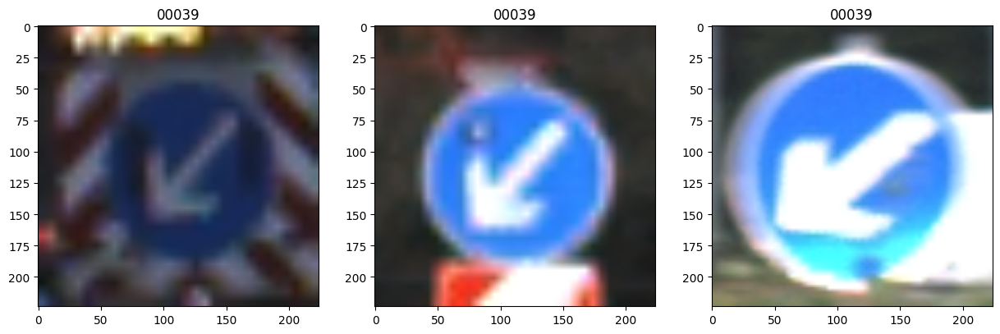

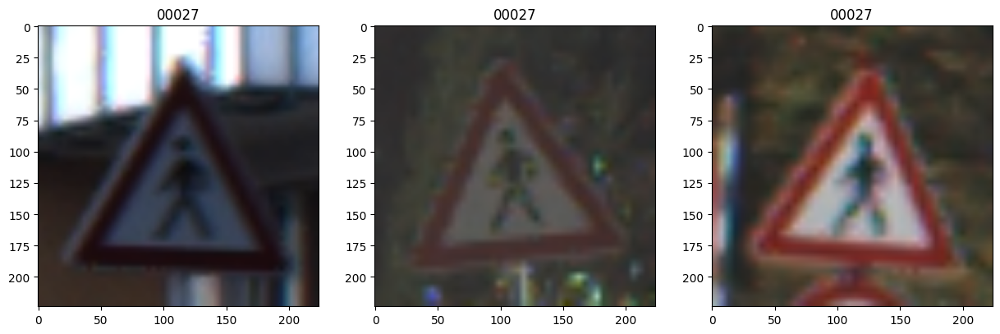

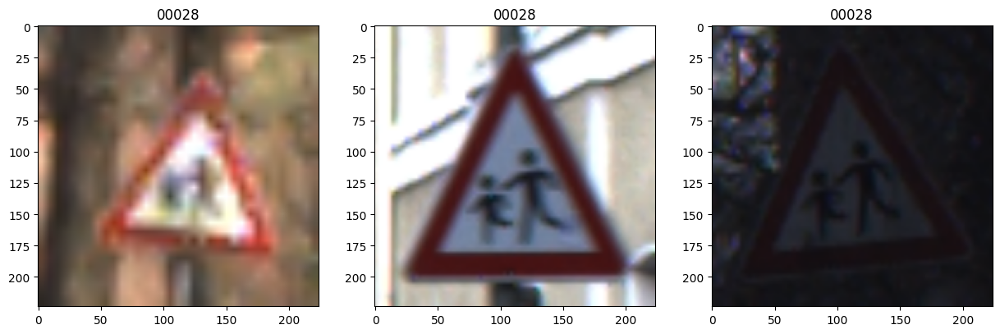

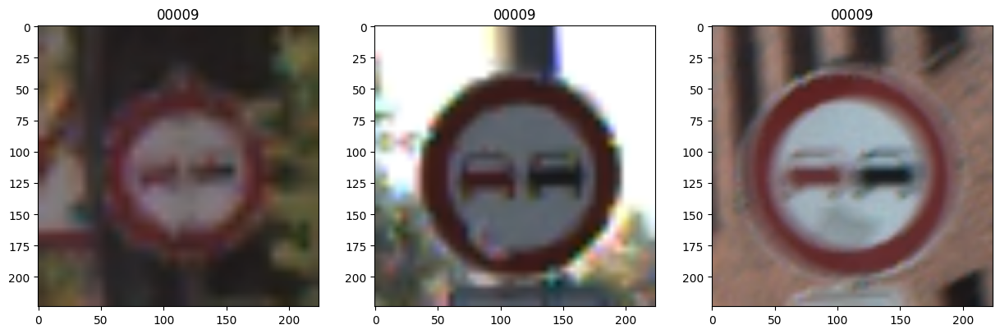

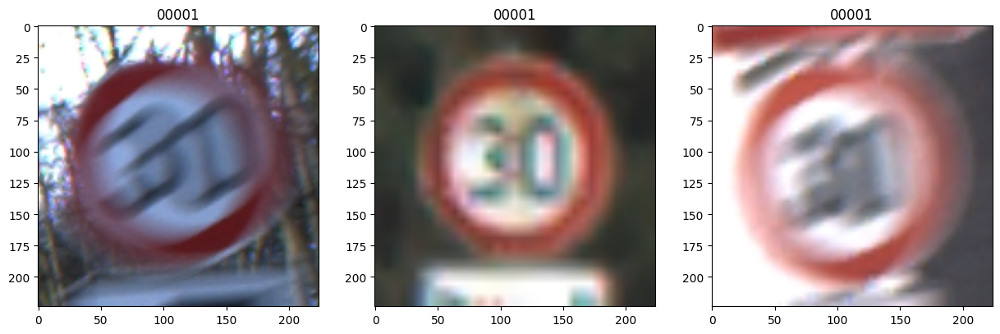

...

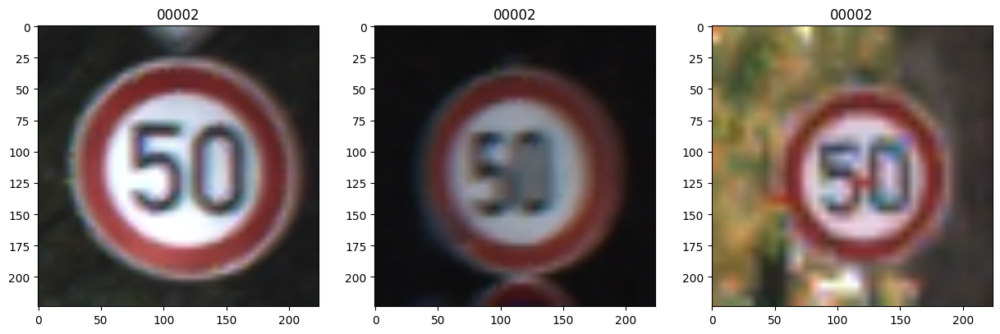

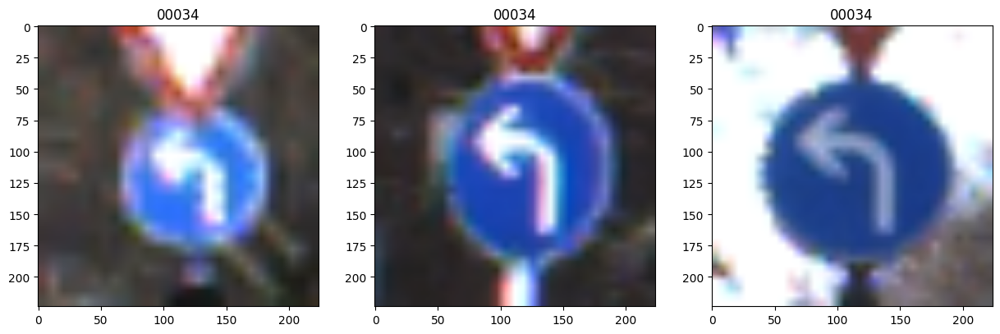

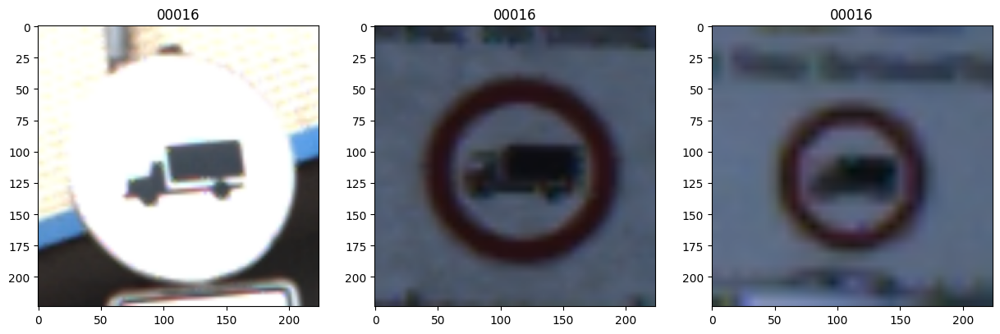

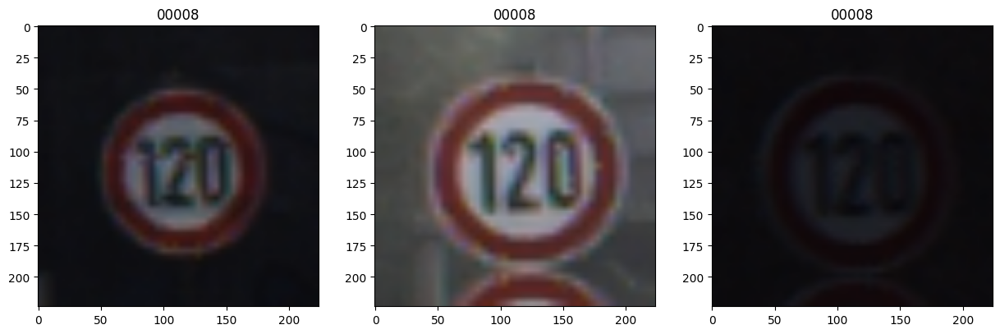

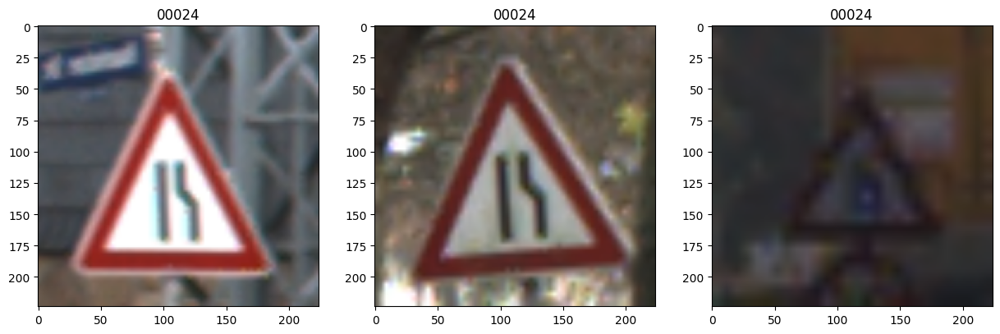

In [12]:
for image_path in image_paths:
    plt.figure(figsize=(15, 15))
    image_files = os.listdir(root_path + '/' + image_path) # Added a slash here
    for i in range(3):
        image = plt.imread(f"{root_path}/{image_path}/{image_files[i+25]}")
        image = cv2.resize(image, (224, 224))
        plt.subplot(1, 3, i+1)
        plt.imshow(image)
        plt.title(str(image_path))
    plt.show()

In [13]:
import pandas as pd
import os
import numpy as np
from tqdm import tqdm

root_path = 'gtsrb_data/GTSRB/Final_Training/Images'

# Get all subfolder names (class directories)
all_paths = os.listdir(root_path)
all_paths.sort()

# Create a new DataFrame
data = pd.DataFrame()
counter = 0

# Store all images in the dataframe
for i, class_folder in tqdm(enumerate(all_paths), total=len(all_paths)):
    class_path = os.path.join(root_path, class_folder)
    all_images = os.listdir(class_path)

    for image in all_images:
        if image.endswith('.ppm'):
            full_image_path = os.path.join(class_path, image)
            data.loc[counter, 'image_path'] = full_image_path
            data.loc[counter, 'label'] = i
            counter += 1

# Shuffle the dataset
data = data.sample(frac=1).reset_index(drop=True)

# ✅ Save to current working directory or inside gtsrb_data
data.to_csv('gtsrb_data/data.csv', index=False)

print(data.head(5))


100%|██████████| 43/43 [01:01<00:00,  1.43s/it]

                                          image_path  label
0  gtsrb_data/GTSRB/Final_Training/Images/00004/0...    4.0
1  gtsrb_data/GTSRB/Final_Training/Images/00018/0...   18.0
2  gtsrb_data/GTSRB/Final_Training/Images/00016/0...   16.0
3  gtsrb_data/GTSRB/Final_Training/Images/00009/0...    9.0
4  gtsrb_data/GTSRB/Final_Training/Images/00028/0...   28.0


In [18]:
import torch
import pandas as pd
import cv2
import albumentations
import numpy as np
import matplotlib.pyplot as plt

from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split

class GTSRDataset(Dataset):
    def __init__(self, images, labels, tfms=None):
        self.images = images
        self.labels = labels

        # apply augmentations
        if tfms == 0: # if validating
            self.aug = albumentations.Compose([
                # 48x48 resizing is required
                albumentations.Resize(48, 48, always_apply=True),

            ])
        else: # if training
            self.aug = albumentations.Compose([
                # 48x48 resizing is required
                albumentations.Resize(48, 48, always_apply=True),
            ])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, index):
        image = plt.imread(self.images[index]) # Removed the extra '.ppm'
        image = image / 255.
        image = self.aug(image=np.array(image))['image']
        image = np.transpose(image, (2, 0, 1))
        label = self.labels[index]

        return {
            'image': torch.tensor(image, dtype=torch.float),
            'label': torch.tensor(label, dtype=torch.long)
        }

df = pd.read_csv('/content/gtsrb_data/data.csv',
                 nrows=5000)

X = df.image_path.values
y = df.label.values

(xtrain, xtest, ytrain, ytest) = train_test_split(X, y,
                                test_size=0.10, random_state=42)
print(f"Training instances: {len(xtrain)}")
print(f"Validation instances: {len(xtest)}")

train_data = GTSRDataset(xtrain, ytrain, tfms=1)
val_data = GTSRDataset(xtest, ytest, tfms=0)


batch_size = 256
train_data_loader = DataLoader(
    train_data,
    batch_size=batch_size,
    shuffle=True,
    # num_workers=1,
)
val_data_loader = DataLoader(
    val_data,
    batch_size=batch_size,
    shuffle=False,
    # num_workers=1,
)

# visualization
visualize = False
if visualize:
    for i in range(1):
        sign_df = pd.read_csv(
            '/content/gtsrb_data/data.csv'
            )
        sample = train_data[i]
        image = sample['image']
        label = sample['label']
        image = np.array(np.transpose(image, (1, 2, 0)))
        plt.imshow(image)
        plt.title(str(sign_df.loc[int(label), 'SignName']))
        plt.show()

Training instances: 4500
Validation instances: 500


/tmp/ipython-input-18-1222101954.py:26: UserWarning: Argument(s) 'always_apply' are not valid for transform Resize
  albumentations.Resize(48, 48, always_apply=True),
/tmp/ipython-input-18-1222101954.py:20: UserWarning: Argument(s) 'always_apply' are not valid for transform Resize
  albumentations.Resize(48, 48, always_apply=True),


In [19]:

import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import numpy as np
import matplotlib.pyplot as plt
import torch.optim as optim

from torch.autograd import Variable
from torchvision import datasets, transforms
from torch.autograd import Variable

nclasses = 43 # GTSRB has 43 classes
DEBUG = False

def gaussian_filter(kernel_shape):
    x = np.zeros(kernel_shape, dtype='float32')
    def gauss(x, y, sigma=2.0):
        Z = 2 * np.pi * sigma ** 2
        return  1. / Z * np.exp(-(x ** 2 + y ** 2) / (2. * sigma ** 2))
    mid = np.floor(kernel_shape[-1] / 2.)
    for kernel_idx in range(0, kernel_shape[1]):
        for i in range(0, kernel_shape[2]):
            for j in range(0, kernel_shape[3]):
                x[0, kernel_idx, i, j] = gauss(i - mid, j - mid)
    return x / np.sum(x)

def LCN(image_tensor, gaussian, mid):
    filtered= gaussian(image_tensor)
    centered_image = image_tensor - filtered[:,:,mid:-mid,mid:-mid]
    sum_sqr_XX = gaussian(centered_image.pow(2))
    denom = sum_sqr_XX[:,:,mid:-mid,mid:-mid].sqrt()
    per_img_mean = denom.mean()
    divisor = torch.max(per_img_mean, denom)
    divisor = np.maximum(divisor.detach().cpu().numpy(), 1e-4)
    new_image = centered_image.detach().cpu() / divisor
    if DEBUG: # visualize what the network sees
        plt.imshow(np.transpose(filtered[0].detach().cpu().numpy(),
                   (1, 2, 0)).reshape(filtered.shape[2], filtered.shape[3]))
        plt.title('Gaussian')
        plt.show()
        print('GAUSSIAN', filtered)
        print('LCN', new_image)
        plt.imshow(np.transpose(new_image[0, :3].detach().cpu().numpy(),
                   (1, 2, 0)))
        plt.title('LCN')
        plt.show()
    return new_image.cuda()


class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(3, 200, kernel_size=7 ,stride=1, padding=2)
        self.maxpool1 = nn.MaxPool2d(2, stride=2 , ceil_mode=True)
        self.gfilter1 = torch.Tensor(gaussian_filter((1,200,9,9)) )
        self.gaussian1 = nn.Conv2d(in_channels=200, out_channels=200,
                            kernel_size=9  , padding= 8 , bias=False)
        self.gaussian1.weight.data = self.gfilter1
        self.gaussian1.weight.requires_grad = False
        self.conv2 = nn.Conv2d(200, 250, kernel_size=4 ,stride=1, padding=2)
        self.maxpool2 = nn.MaxPool2d(2, stride=2 , ceil_mode=True)
        self.gfilter2 = torch.Tensor(gaussian_filter((1,250,9,9)) )
        self.gaussian2  = nn.Conv2d(in_channels=250, out_channels=250,
                            kernel_size=9  , padding= 8 , bias=False)
        self.gaussian2.weight.data = self.gfilter2
        self.gaussian2.weight.requires_grad = False
        self.conv3 = nn.Conv2d(250, 350, kernel_size=4 ,stride=1, padding=2)
        self.maxpool3 = nn.MaxPool2d(2, stride=2)
        self.gfilter3 = torch.Tensor(gaussian_filter((1,350,9,9)) )
        self.gaussian3  = nn.Conv2d(in_channels=350, out_channels=350,
                            kernel_size=9  , padding= 8 , bias=False)
        self.gaussian3.weight.data = self.gfilter3
        self.gaussian3.weight.requires_grad = False
        self.FC1 = nn.Linear(12600, 400)
        self.FC2 = nn.Linear(400, 43)

        # spatial attention model, spatial transformers layers
        self.st1 = nn.Sequential(
            nn.MaxPool2d(2, stride=2 , ceil_mode=True),
            nn.Conv2d(3, 250, kernel_size=5 ,stride=1, padding=2),
            nn.ReLU(True),
            nn.MaxPool2d(2, stride=2 , ceil_mode=True),
            nn.Conv2d(250, 250, kernel_size=5 ,stride=1, padding=2),
            nn.ReLU(True),
            nn.MaxPool2d(2, stride=2 , ceil_mode=True)
        )
        self.FC1_ = nn.Sequential(
            nn.Linear(9000, 250),
            nn.ReLU(True),
            nn.Linear( 250 , 6 )
        )
        self.st2 = nn.Sequential(
            nn.MaxPool2d(2, stride=2 , ceil_mode=False),
            nn.Conv2d(200, 150, kernel_size=5 ,stride=1, padding=2),
            nn.ReLU(True),
            nn.MaxPool2d(2, stride=2 , ceil_mode=False),
            nn.Conv2d(150, 200, kernel_size=5 ,stride=1, padding=2),
            nn.ReLU(True),
            nn.MaxPool2d(2, stride=2 , ceil_mode=False)
        )
        self.FC2_ =  nn.Sequential(
            nn.Linear(800, 300),
            nn.ReLU(True),
            nn.Linear( 300 , 6 )
        )
        self.st3 = nn.Sequential(
            nn.MaxPool2d(2, stride=2 , ceil_mode=False),
            nn.Conv2d(250, 150, kernel_size=5 ,stride=1, padding=2),
            nn.ReLU(True),
            nn.MaxPool2d(2, stride=2 , ceil_mode=False),
            nn.Conv2d(150, 200, kernel_size=5 ,stride=1, padding=2),
            nn.ReLU(True),
            nn.MaxPool2d(2, stride=2 , ceil_mode=False)
        )
        self.FC3_ =  nn.Sequential(
            nn.Linear(200, 300),
            nn.ReLU(True),
            nn.Linear( 300 , 6 )
        )
        self.FC1_[2].weight.data.zero_()
        self.FC1_[2].bias.data.copy_(torch.tensor([1, 0, 0, 0, 1, 0], dtype=torch.float))
        self.FC2_[2].weight.data.zero_()
        self.FC2_[2].bias.data.copy_(torch.tensor([1, 0, 0, 0, 1, 0], dtype=torch.float))
        self.FC3_[2].weight.data.zero_()
        self.FC3_[2].bias.data.copy_(torch.tensor([1, 0, 0, 0, 1, 0], dtype=torch.float))

    def forward(self, x):
        # first layer is the Spatial Transformer Layer
        # ST-1
        h1 = self.st1(x)
        h1 = h1.view(-1, 9000)
        h1 = self.FC1_(h1)
        theta1 = h1.view(-1, 2, 3)
        grid1 = F.affine_grid(theta1, x.size())
        x = F.grid_sample(x, grid1)

        # convolution, Relu and Maxpool , SET #1
        x = F.relu(self.conv1(x))
        x =  self.maxpool1(x)

        # paper Says to apply LCN here, but LCN Layer Before Convolution Worked for me better
        # ST-2
        h2 = self.st2(x)
        h2=h2.view(-1,800)
        h2 = self.FC2_(h2)
        theta2 = h2.view(-1, 2, 3)
        grid2 = F.affine_grid(theta2, x.size())
        x = F.grid_sample(x, grid2)

        # LCN Layer : Based on paper implemntation from the github and Yann Lecun Paper 2009
        mid1 = int(np.floor(self.gfilter1.shape[2] / 2.))
        x = LCN(x , self.gaussian1, mid1)

        # convolution, Relu and Maxpool , SET #2
        x = F.relu(self.conv2(x))
        x=  self.maxpool2(x)

        # ST-2
        h3 = self.st3(x)
        h3 = h3.view(-1, 200)
        h3 = self.FC3_(h3)
        theta3 = h3.view(-1, 2, 3)
        grid3 = F.affine_grid(theta3, x.size())
        x = F.grid_sample(x, grid3)

        # LCN Layer : 2
        mid2 = int(np.floor(self.gfilter2.shape[2] / 2.))
        x = LCN(x , self.gaussian2, mid2)

        # convolution, Relu and Maxpool , SET #3
        x = F.relu(self.conv3(x))
        x=  self.maxpool3(x)

        # LCN Layer : 3
        mid3 = int(np.floor(self.gfilter3.shape[2] / 2.))
        x = LCN(x , self.gaussian3, mid3)

        # dimensions in accordance to paper
        y = x.view(-1, 12600)
        y = F.relu(self.FC1(y))
        y = self.FC2(y)
        return F.log_softmax(y, dim=-1)


Epoch 1 of 20
Training


  0%|          | 0/17 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
  6%|▌         | 1/17 [00:02<00:36,  2.29s/it]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: U

Validating


  0%|          | 0/1 [00:00<?, ?it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
2it [00:00,  2.26it/s]


Train Loss: 0.0202, Train Acc: 14.64
Val Loss: 0.0117, Val Acc: 27.20
Epoch 2 of 20
Training


  6%|▌         | 1/17 [00:00<00:07,  2.14it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
 12%|█▏        | 2/17 [00:00<00:06,  2.18it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __

Validating


  0%|          | 0/1 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
2it [00:01,  2.00it/s]


Train Loss: 0.0095, Train Acc: 38.87
Val Loss: 0.0082, Val Acc: 46.80
Epoch 3 of 20
Training


  0%|          | 0/17 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
 12%|█▏        | 2/17 [00:00<00:07,  2.08it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: U

Validating


  0%|          | 0/1 [00:00<?, ?it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
2it [00:00,  2.30it/s]


Train Loss: 0.0069, Train Acc: 54.24
Val Loss: 0.0066, Val Acc: 56.80
Epoch 4 of 20
Training


 12%|█▏        | 2/17 [00:00<00:06,  2.26it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_sc

Validating


  0%|          | 0/1 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
100%|██████████| 1/1 [00:00<00:00,  2.17it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap

Train Loss: 0.0053, Train Acc: 66.49
Val Loss: 0.0056, Val Acc: 65.00
Epoch 5 of 20
Training


  6%|▌         | 1/17 [00:00<00:07,  2.23it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
 18%|█▊        | 3/17 [00:01<00:06,  2.21it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __

Validating


  0%|          | 0/1 [00:00<?, ?it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
100%|██████████| 1/1 [00:00<00:00,  1.49it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
2it [00:01,  1.64it/s]


Train Loss: 0.0042, Train Acc: 74.31
Val Loss: 0.0045, Val Acc: 71.00
Epoch 6 of 20
Training


  0%|          | 0/17 [00:00<?, ?it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
  6%|▌         | 1/17 [00:00<00:07,  2.08it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
 18%|█▊        | 3/17 [00:01<00:06,  2.18it/s]/usr/local/lib/python3.1

Validating


  0%|          | 0/1 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
100%|██████████| 1/1 [00:00<00:00,  2.02it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap

Train Loss: 0.0034, Train Acc: 80.02
Val Loss: 0.0040, Val Acc: 75.80
Epoch 7 of 20
Training


  0%|          | 0/17 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
 18%|█▊        | 3/17 [00:01<00:06,  2.14it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: U

Validating


  0%|          | 0/1 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
2it [00:01,  1.80it/s]


Train Loss: 0.0029, Train Acc: 82.47
Val Loss: 0.0037, Val Acc: 77.40
Epoch 8 of 20
Training


  6%|▌         | 1/17 [00:00<00:12,  1.24it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_sc

Validating


  0%|          | 0/1 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
2it [00:00,  2.12it/s]


Train Loss: 0.0024, Train Acc: 87.78
Val Loss: 0.0032, Val Acc: 81.20
Epoch 9 of 20
Training


  0%|          | 0/17 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arg

Validating


  0%|          | 0/1 [00:00<?, ?it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
100%|██████████| 1/1 [00:00<00:00,  2.07it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap

Train Loss: 0.0020, Train Acc: 90.31
Val Loss: 0.0029, Val Acc: 80.20
Epoch 10 of 20
Training


  6%|▌         | 1/17 [00:00<00:07,  2.18it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
 29%|██▉       | 5/17 [00:02<00:05,  2.16it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py

Validating


  0%|          | 0/1 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
2it [00:00,  2.22it/s]


Train Loss: 0.0017, Train Acc: 92.18
Val Loss: 0.0028, Val Acc: 81.60
Epoch 11 of 20
Training


  0%|          | 0/17 [00:00<?, ?it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
 24%|██▎       | 4/17 [00:01<00:05,  2.20it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: U

Validating


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
2it [00:01,  1.93it/s]


Train Loss: 0.0015, Train Acc: 94.33
Val Loss: 0.0025, Val Acc: 83.20
Epoch 12 of 20
Training


 12%|█▏        | 2/17 [00:00<00:07,  2.06it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
 18%|█▊        | 3/17 [00:01<00:06,  2.12it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
 24%|██▎       | 4/17 [00:01<00:06,  2.14it/s]/tmp/ipython-inp

Validating


  0%|          | 0/1 [00:00<?, ?it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
100%|██████████| 1/1 [00:00<00:00,  2.09it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap

Train Loss: 0.0013, Train Acc: 95.29
Val Loss: 0.0022, Val Acc: 87.40
Epoch 13 of 20
Training


  6%|▌         | 1/17 [00:00<00:07,  2.20it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
 24%|██▎       | 4/17 [00:01<00:06,  2.10it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __

Validating


  0%|          | 0/1 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages

Train Loss: 0.0011, Train Acc: 96.64
Val Loss: 0.0023, Val Acc: 85.20
Epoch 14 of 20
Training


  0%|          | 0/17 [00:00<?, ?it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
  6%|▌         | 1/17 [00:00<00:07,  2.18it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
 24%|██▎       | 4/17 [00:01<00:05,  2.18it/s]/tmp/ipython-input-19-25

Validating


  0%|          | 0/1 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
100%|██████████| 1/1 [00:00<00:00,  2.19it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
2it [00:00,  2.23it/s]


Train Loss: 0.0010, Train Acc: 96.09
Val Loss: 0.0021, Val Acc: 88.80
Epoch 15 of 20
Training


  0%|          | 0/17 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
  6%|▌         | 1/17 [00:00<00:07,  2.20it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
 12%|█▏        | 2/17 [00:00<00:06,  2.21it/s]/usr/local/lib/python3.1

Validating


  0%|          | 0/1 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
100%|██████████| 1/1 [00:00<00:00,  1.92it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: Use

Train Loss: 0.0009, Train Acc: 97.33
Val Loss: 0.0021, Val Acc: 85.80
Epoch 16 of 20
Training


 12%|█▏        | 2/17 [00:01<00:07,  2.00it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
 18%|█▊        | 3/17 [00:01<00:06,  2.10it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py

Validating


100%|██████████| 1/1 [00:00<00:00,  2.21it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
2it [00:00,  2.25it/s]


Train Loss: 0.0008, Train Acc: 97.33
Val Loss: 0.0020, Val Acc: 85.80
Epoch 17 of 20
Training


 18%|█▊        | 3/17 [00:01<00:06,  2.18it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_sc

Validating


  0%|          | 0/1 [00:00<?, ?it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
2it [00:00,  2.21it/s]


Train Loss: 0.0007, Train Acc: 98.11
Val Loss: 0.0018, Val Acc: 89.00
Epoch 18 of 20
Training


  0%|          | 0/17 [00:00<?, ?it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
 12%|█▏        | 2/17 [00:00<00:06,  2.15it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wr

Validating


  0%|          | 0/1 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
100%|██████████| 1/1 [00:00<00:00,  2.19it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
2it [00:00,  2.19it/s]


Train Loss: 0.0006, Train Acc: 98.80
Val Loss: 0.0018, Val Acc: 88.20
Epoch 19 of 20
Training


  0%|          | 0/17 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
  6%|▌         | 1/17 [00:00<00:07,  2.15it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
 12%|█▏        | 2/17 [00:00<00:06,  2.15it/s]/usr/local/lib/python3.1

Validating


100%|██████████| 1/1 [00:00<00:00,  1.92it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
2it [00:01,  1.94it/s]


Train Loss: 0.0006, Train Acc: 98.80
Val Loss: 0.0016, Val Acc: 88.80
Epoch 20 of 20
Training


 18%|█▊        | 3/17 [00:01<00:06,  2.15it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_sc

Validating


100%|██████████| 1/1 [00:00<00:00,  2.20it/s]/tmp/ipython-input-19-2568564171.py:36: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  new_image = centered_image.detach().cpu() / divisor
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5082: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/functional.py:5015: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
2it [00:00,  2.19it/s]


Train Loss: 0.0005, Train Acc: 98.69
Val Loss: 0.0018, Val Acc: 88.20


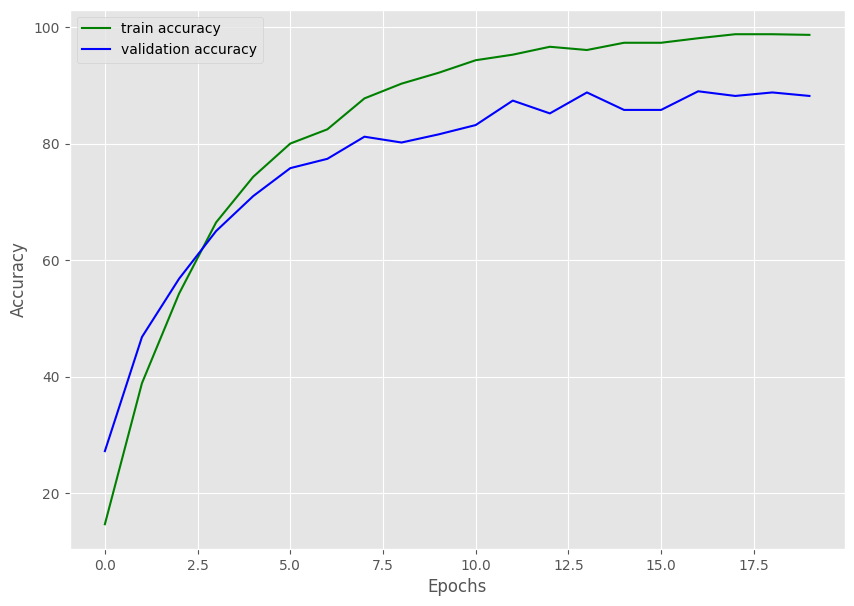

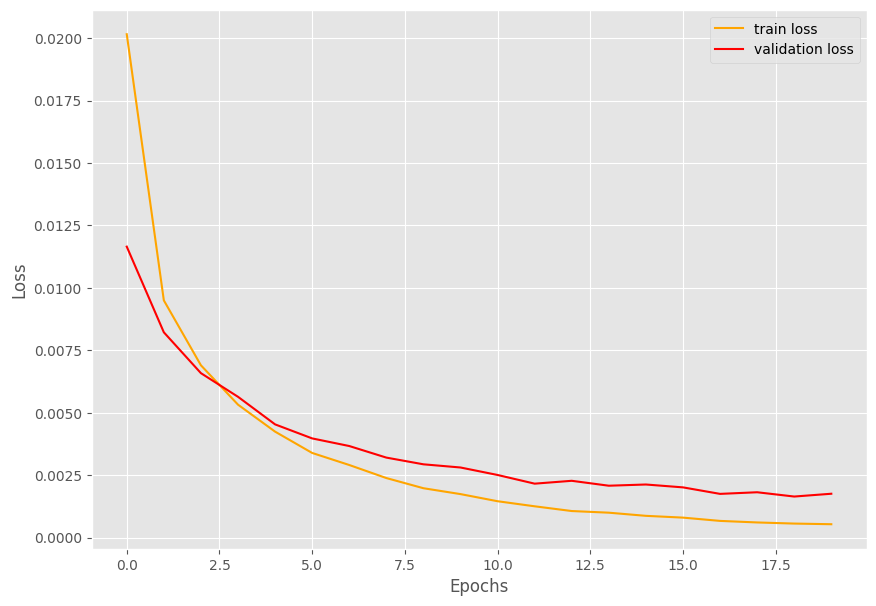

In [20]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import matplotlib
import numpy as np

matplotlib.style.use('ggplot')

# learning parameters
epochs = 20
lr = 0.001
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# training function
def fit(model, dataloader, optimizer, criterion, train_data):
    print('Training')
    model.train()
    train_running_loss = 0.0
    train_running_correct = 0
    for i, data in tqdm(enumerate(dataloader), total=int(len(train_data)/dataloader.batch_size)):
        image, target = data['image'].to(device), data['label'].to(device)
        plt.show()
        optimizer.zero_grad()
        outputs = model(image)
        loss = criterion(outputs, target)
        train_running_loss += loss.item()
        _, preds = torch.max(outputs.data, 1)
        train_running_correct += (preds == target).sum().item()
        loss.backward()
        optimizer.step()

    train_loss = train_running_loss/len(dataloader.dataset)
    train_accuracy = 100. * train_running_correct/len(dataloader.dataset)
    return train_loss, train_accuracy

# validation function
def validate(model, dataloader, optimizer, criterion, val_data):
    print('Validating')
    model.eval()
    val_running_loss = 0.0
    val_running_correct = 0
    with torch.no_grad():
        for i, data in tqdm(enumerate(dataloader), total=int(len(val_data)/dataloader.batch_size)):
            image, target = data['image'].to(device), data['label'].to(device)
            outputs = model(image)
            loss = criterion(outputs, target)
            val_running_loss += loss.item()
            _, preds = torch.max(outputs.data, 1)
            val_running_correct += (preds == target).sum().item()

        val_loss = val_running_loss / len(dataloader.dataset)
        val_accuracy = 100. * (val_running_correct / len(dataloader.dataset))
        return val_loss, val_accuracy

# initialize the model
model = Net()
model = model.to(device)
# optimizer and loss function
optimizer = optim.Adam(model.parameters(), lr=lr, betas=(0.9, 0.999),
                       eps=1e-8, weight_decay=0.0005)
criterion = nn.CrossEntropyLoss()

train_loss , train_accuracy = [], []
val_loss , val_accuracy = [], []
for epoch in range(epochs):
    print(f"Epoch {epoch+1} of {epochs}")
    train_epoch_loss, train_epoch_accuracy = fit(model, train_data_loader,
                                                 optimizer, criterion,
                                                 train_data)
    val_epoch_loss, val_epoch_accuracy = validate(model, val_data_loader,
                                                 optimizer, criterion,
                                                 val_data)
    train_loss.append(train_epoch_loss)
    train_accuracy.append(train_epoch_accuracy)
    val_loss.append(val_epoch_loss)
    val_accuracy.append(val_epoch_accuracy)
    print(f"Train Loss: {train_epoch_loss:.4f}, Train Acc: {train_epoch_accuracy:.2f}")
    print(f'Val Loss: {val_epoch_loss:.4f}, Val Acc: {val_epoch_accuracy:.2f}')

# Make sure the directory exists
output_dir = 'outputs'
os.makedirs(output_dir, exist_ok=True)

# Accuracy plots
plt.figure(figsize=(10, 7))
plt.plot(train_accuracy, color='green', label='train accuracy')
plt.plot(val_accuracy, color='blue', label='validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.savefig(os.path.join(output_dir, 'accuracy.png'))
plt.show()

# Loss plots
plt.figure(figsize=(10, 7))
plt.plot(train_loss, color='orange', label='train loss')
plt.plot(val_loss, color='red', label='validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(os.path.join(output_dir, 'loss.png'))
plt.show()

# Save model checkpoint
torch.save({
    'epoch': epochs,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': criterion,
}, os.path.join(output_dir, 'model.pth'))